# Analysing dialogues between speakers of different ages

## Task 1: Description of Data and Methods (10/50) – (~max 600 words)

BNC2014spoken-xml v1.1 dataset contains the following files that are used for this project:

- spoken
    - tagged : all the tagged data in xml format. Contains individual words for each utterances and their attributes.
    - untgged : all the untagged data in xml format. Contains utterances and speakers for that particualr dialogues.
    - metadata : text and XML files containing corpus metadata

Q1. What basic preprocessing steps would be needed to work with this data (e.g. tokenization, embeddings etc)

Ans: The basic preprocessing steps that would be needed to work with this data are:

- Data Gathering : The dataset is in xml format and is split into tagged and untagged data. We need to gather the data that is required for our analysis and store it in a dataframe.

- Data Cleaning : The data contains a lot of unnecessary information that is not required for our analysis. We need to clean the data and remove the unnecessary information.

- Data Preprocessing : The data contains a lot of noise and we need to remove the noise from the data. We need to remove the stop words, punctuations, special characters, etc. from the data. This contains the tokenization of the data and extracting the features from the data.


Q2. What feature extraction or analysis methods can you use to gain insights into the data before modeling? (basic counts like sentence length, proposition of pos tags, using linguistic resources, or clustering)

Ans: What I did was I am collecting the utterance from the xml file and calculating a list of linguistic features for each utterance. The features that I am calculating are:

- Lexical Diversity : to check the uniqueness
- Sentence Length : to check the length of the sentence
- Discourse Markers Count : the number of discourse markers in the sentence
- Fillers Count : the number of fillers in the sentence
- Hesitation Count : the number of hesitation in the sentence
- Speech Rate : the speech rate of the sentence

All of these features are calculated in the function 'extract_linguistic_features' which takes a preprocessed utterance(stop words, punctuations, special characters removed) as input and returns a sictionary of linguistic features. Visualizations of these features are also included.


Q3. What are common deep learning approaches to extracting information from textual data, what challenges and trade-offs are there when making an appropriate choice?

Ans: Some of the DL approaches are Long Short Term Memory (LSTM), Recurrent Neural Network (RNN), Convolutional Neural Network (CNN), Transformer models like BERT, etc. I have also included BERT model in my analysis. The challenges are huge when it comes to DL approaches.

- Data Abailability : The data that is required for DL approaches is huge and it is not always available. We need to have a huge amount of data to train the model.
- Data Quality : The data that is required for DL approaches should be of high quality. The data should be clean and should not contain any noise.
- Model Complexity : The model that is used for DL approaches is very complex and it is very difficult to understand the model. 
- Computational Power : Requires a lot of computational power to train the model.

and many more.


Q4. How would you evaluate machine learning systems that generate or classify text data where the gold standard can vary? or, how can you examine errors? (e.g. metrics of fluency, faithfulness, or use of confusion matrices, precision, recall, F1 score, evaluating performance in different subsets of data)

Ans: 

- Confusion Matrix : We can use the confusion matrix to evaluate the performance of the machine learning systems. This will help us to understand the performance of the machine learning systems and we can use this information to improve the performance of the machine learning systems.

- Precision : Precision is the ratio of correctly predicted positive observations to the total predicted positive observations.

- Recall : Recall is the ratio of correctly predicted positive observations to the all observations in actual class.

- F1 Score : F1 Score is the weighted average of Precision and Recall. Therefore, this score takes both false positives and false negatives into account.

- Accuracy : Accuracy is the most intuitive performance measure and it is simply a ratio of correctly predicted observation to the total observations.

## Task 2: Investigate, model, and report on insights from friends dialogue data (40/50) – (~max
1800 words)


In [1]:
import os
import re
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Set the path to the BNC2014 dataset
bnc_path = "bnc2014spoken-xml"

In [2]:
import nltk
nltk.download("punkt")
nltk.download("stopwords")
nltk.download("wordnet")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\abhij\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\abhij\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\abhij\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [3]:
dir_corpus = 'bnc2014spoken-xml/spoken/untagged/'
print(dir_corpus)
f_names = os.listdir(dir_corpus)
f_paths = [f"{dir_corpus}{f_name}" for f_name in f_names]

# f_paths = ['bnc2014spoken-xml/spoken/untagged/S2A5.xml']

f_paths

bnc2014spoken-xml/spoken/untagged/


['bnc2014spoken-xml/spoken/untagged/S23A.xml',
 'bnc2014spoken-xml/spoken/untagged/S24A.xml',
 'bnc2014spoken-xml/spoken/untagged/S24D.xml',
 'bnc2014spoken-xml/spoken/untagged/S24E.xml',
 'bnc2014spoken-xml/spoken/untagged/S263.xml',
 'bnc2014spoken-xml/spoken/untagged/S26N.xml',
 'bnc2014spoken-xml/spoken/untagged/S27D.xml',
 'bnc2014spoken-xml/spoken/untagged/S28F.xml',
 'bnc2014spoken-xml/spoken/untagged/S29Q.xml',
 'bnc2014spoken-xml/spoken/untagged/S29X.xml',
 'bnc2014spoken-xml/spoken/untagged/S2A5.xml',
 'bnc2014spoken-xml/spoken/untagged/S2AJ.xml',
 'bnc2014spoken-xml/spoken/untagged/S2AX.xml',
 'bnc2014spoken-xml/spoken/untagged/S2B5.xml',
 'bnc2014spoken-xml/spoken/untagged/S2C9.xml',
 'bnc2014spoken-xml/spoken/untagged/S2CY.xml',
 'bnc2014spoken-xml/spoken/untagged/S2DD.xml',
 'bnc2014spoken-xml/spoken/untagged/S2E2.xml',
 'bnc2014spoken-xml/spoken/untagged/S2EF.xml',
 'bnc2014spoken-xml/spoken/untagged/S2FQ.xml',
 'bnc2014spoken-xml/spoken/untagged/S2FT.xml',
 'bnc2014spok

In [4]:
dialogue_data = []
for path in f_paths: # for each of the dialogues
    print(path)
    df_utts = pd.read_xml(path, xpath="//u")
    df_speakers = pd.read_xml(path, xpath="//speaker")
    dialogue_data.append((df_utts, df_speakers))
    # break

bnc2014spoken-xml/spoken/untagged/S23A.xml
bnc2014spoken-xml/spoken/untagged/S24A.xml
bnc2014spoken-xml/spoken/untagged/S24D.xml
bnc2014spoken-xml/spoken/untagged/S24E.xml
bnc2014spoken-xml/spoken/untagged/S263.xml
bnc2014spoken-xml/spoken/untagged/S26N.xml
bnc2014spoken-xml/spoken/untagged/S27D.xml
bnc2014spoken-xml/spoken/untagged/S28F.xml
bnc2014spoken-xml/spoken/untagged/S29Q.xml
bnc2014spoken-xml/spoken/untagged/S29X.xml
bnc2014spoken-xml/spoken/untagged/S2A5.xml
bnc2014spoken-xml/spoken/untagged/S2AJ.xml
bnc2014spoken-xml/spoken/untagged/S2AX.xml
bnc2014spoken-xml/spoken/untagged/S2B5.xml
bnc2014spoken-xml/spoken/untagged/S2C9.xml
bnc2014spoken-xml/spoken/untagged/S2CY.xml
bnc2014spoken-xml/spoken/untagged/S2DD.xml
bnc2014spoken-xml/spoken/untagged/S2E2.xml
bnc2014spoken-xml/spoken/untagged/S2EF.xml
bnc2014spoken-xml/spoken/untagged/S2FQ.xml
bnc2014spoken-xml/spoken/untagged/S2FT.xml
bnc2014spoken-xml/spoken/untagged/S2GC.xml
bnc2014spoken-xml/spoken/untagged/S2GS.xml
bnc2014spok

In [5]:
# Concatenate all speakers dataframes into one
df_all_speakers = pd.concat([speaker_data[1] for speaker_data in dialogue_data])
df_all_speakers

,id,exactage,age1994,agerange,gender,nat,birthplace,birthcountry,l1,lingorig,...,dialect_l2,dialect_l3,dialect_l4,edqual,occupation,socgrade,nssec,l2,fls,in_core
0,S0021,27,25_34,19_29,F,British,Swindon,England,English,England,...,england,south,southwest,5_postgrad,Teacher,B,2,None,None,y
1,S0032,28,25_34,19_29,M,British,Yoevil,England,English,England,...,england,south,southwest,4_graduate,Software developer,A,1_2,None,None,y
2,S0094,33,25_34,30_39,F,British,Swindon,England,English,England,...,england,south,southwest,5_postgrad,PhD student,A,1_2,German,Welsh -- Beginner,y
3,S0095,33,25_34,30_39,M,British,Camarthen,Scotland,English,England,...,wales,wales,wales,5_postgrad,Self employed maker,E,uncat,None,None,y
0,S0261,41,35_44,40_49,M,British/New Zealand,Wellington,New Zealand,English,England/NZ,...,non_uk,non_uk,non_uk,4_graduate,Entrepreneur,A,1_2,NaN,None,n
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1,S0510,47,45_59,40_49,F,British,England,England,English,England,...,england,south,unspecified,5_postgrad,Receptionist,D,6,NaN,NaN,y
0,S0058,23,15_24,19_29,F,British,"Sunderland, Tyne and Wear",England,English,England,...,england,north,northeast,4_graduate,Corpus Administrator,B,2,NaN,None,n
1,S0120,23,15_24,19_29,M,British & German,"Pembury, Kent",England,English,England,...,england,south,unspecified,5_postgrad,Graduate Civil Engineer,C1,4,NaN,German -- Advanced; French -- Advanced,n
0,S0428,27,25_34,19_29,F,British,"Aylesbury, Buckinghamshire",England,English,England,...,england,south,eastern_engl,5_postgrad,Language Research Co-ordinator,A,1_2,NaN,Spanish -- level unspecified; Italian -- level...,y


In [6]:
# Concatenate all utterances dataframes into one
df_all_utts = pd.concat([utt_data[0] for utt_data in dialogue_data])
df_all_utts

,n,who,u,unclear,trans,whoConfidence,vocal,foreign,anon,pause,trunc,shift,event
0,1,S0094,words,None,None,None,NaN,None,NaN,NaN,None,NaN,NaN
1,2,S0095,it's a games word? like a computer games word?,None,None,None,NaN,None,NaN,NaN,None,NaN,NaN
2,3,S0032,yeah yeah,None,None,None,NaN,None,NaN,NaN,None,NaN,NaN
3,4,S0095,oh,oh that's nice,None,None,NaN,None,NaN,NaN,None,NaN,NaN
4,5,S0032,I it's something I,have really heard,overlap,None,NaN,None,NaN,NaN,None,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
315,316,S0432,but,Mai Li,None,None,NaN,NaN,NaN,NaN,None,NaN,NaN
316,317,S0428,None,Sha Li,None,None,NaN,NaN,NaN,NaN,None,NaN,NaN
317,318,S0432,I'll just stick with it yeah,None,overlap,None,NaN,NaN,NaN,NaN,let,NaN,NaN
318,319,S0428,None,None,overlap,None,NaN,NaN,NaN,NaN,None,NaN,NaN


In [7]:
def get_speaker_age(speakerid):
    # get the age of the speaker with the given speakerid
    age = df_all_speakers[df_all_speakers['id'] == speakerid]['agerange'].values
    if len(age) == 0:
        return None
    else:
        return age[0]

get_speaker_age('S0432')

'19_29'

In [8]:
def preprocess_utterance(utterance):
    if utterance is None:
        return ''
    # Remove punctuation and numbers from the conversation transcript
    utterance = re.sub(r'[^\w\s]', '', utterance)  # Remove punctuation
    utterance = re.sub(r'\d+', '', utterance)  # Remove numbers
    utterance = utterance.strip()  # Remove leading/trailing whitespaces
    return utterance

preprocess_utterance("yeah I know but that's why we're an hour late isn't it?")

'yeah I know but thats why were an hour late isnt it'

In [9]:
from nltk.tokenize import word_tokenize

def extract_linguistic_features(preprocessed_conversation):
    # Extract linguistic features from the preprocessed conversation
    if preprocessed_conversation is None:
        return ""

    # Vocabulary Features
    tokens = word_tokenize(preprocessed_conversation)

    word_freq = nltk.FreqDist(tokens)
    lexical_diversity = len(word_freq) / len(tokens) if len(tokens) > 0 else 0
    # specific_word_usage = word_freq['specific_word'] if 'specific_word' in word_freq else 0
    
    # Syntactic Features
    sentences = nltk.sent_tokenize(preprocessed_conversation)
    sentence_length = sum(len(word_tokenize(sentence)) for sentence in sentences) / len(sentences) if len(sentences) > 0 else 0
    
    # Discourse Features
    discourse_markers = ['like', 'you know', 'basically']
    discourse_marker_count = sum(preprocessed_conversation.lower().count(marker) for marker in discourse_markers)
    fillers = ['uh', 'um', 'hmm', 'huh', 'er', 'ah', 'eh', 'mm']
    filler_count = sum(preprocessed_conversation.lower().count(filler) for filler in fillers)
    hesitation_count = discourse_marker_count + filler_count
    
    # Speech Rate
    words = word_tokenize(preprocessed_conversation)
    speech_rate = len(words) / len(sentences) if len(sentences) > 0 else 0
    
    # Return the extracted linguistic features as a dictionary
    linguistic_features = {
        'lexical_diversity': lexical_diversity, # each word is unique
        # 'specific_word_usage': specific_word_usage, # use of specific words
        'sentence_length': sentence_length,
        'discourse_marker_count': discourse_marker_count,
        'filler_count': filler_count,
        'hesitation_count': hesitation_count,
        'speech_rate': speech_rate
    }

    # Convert the dictionary to a string representation
    features_string = " ".join([f"{key}:{value}" for key, value in linguistic_features.items()])
    
    return features_string, linguistic_features

extract_linguistic_features(preprocess_utterance("yeah I know but that's why we're an hour late isn't it?"))[0]

'lexical_diversity:1.0 sentence_length:12.0 discourse_marker_count:0 filler_count:2 hesitation_count:2 speech_rate:12.0'

In [10]:
# loop through each df_all_speakers and get the age of each speaker
# Initialize lists to store speaker information and extracted features

speaker_ids = []
age_labels = []
utterances = []
linguistic_features = []

for i in df_all_utts.index:
    speaker_id = df_all_utts["who"].iloc[i]
    age = get_speaker_age(speaker_id)

    utterance = df_all_utts["u"].iloc[i]
    preprocessed_utterance = preprocess_utterance(utterance)    
    # Step 3: Feature Extraction
    linguistic_feature = extract_linguistic_features(preprocessed_utterance)[0]

    speaker_ids.append(speaker_id)
    age_labels.append(age)
    utterances.append(preprocessed_utterance)
    linguistic_features.append(linguistic_feature)

# Create a DataFrame to store the speaker-level data
df = pd.DataFrame({"SpeakerID": speaker_ids, "AgeLabel": age_labels, "Utterance": utterances, "Features": linguistic_features})

In [11]:
df

,SpeakerID,AgeLabel,Utterance,Features
0,S0094,30_39,words,lexical_diversity:1.0 sentence_length:1.0 disc...
1,S0095,30_39,its a games word like a computer games word,lexical_diversity:0.6666666666666666 sentence_...
2,S0032,19_29,yeah yeah,lexical_diversity:0.5 sentence_length:2.0 disc...
3,S0095,30_39,oh,lexical_diversity:1.0 sentence_length:1.0 disc...
4,S0032,19_29,I its something I,lexical_diversity:0.75 sentence_length:4.0 dis...
...,...,...,...,...
1248105,S0021,19_29,I have like,lexical_diversity:1.0 sentence_length:3.0 disc...
1248106,S0094,30_39,,lexical_diversity:0 sentence_length:0 discours...
1248107,S0032,19_29,,lexical_diversity:0 sentence_length:0 discours...
1248108,S0021,19_29,I have like tomato ketchup emergencies if I ru...,lexical_diversity:0.7391304347826086 sentence_...


### Visualization

In [12]:
df_vis = df.copy()

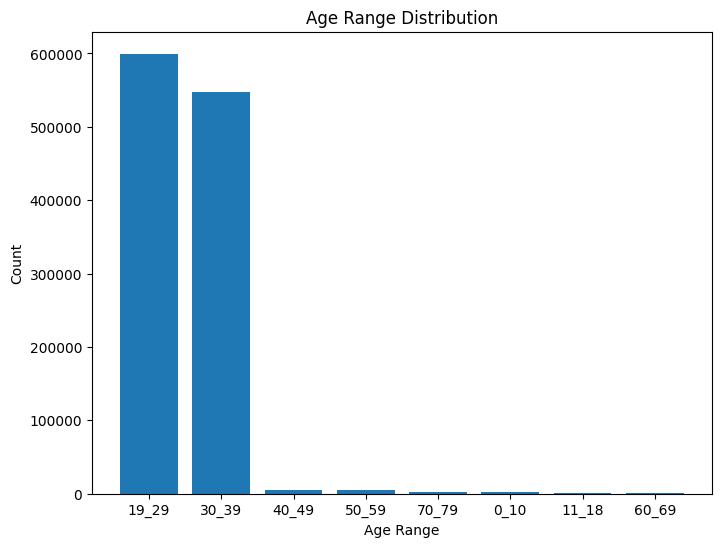

In [13]:
import matplotlib.pyplot as plt

# Count the occurrences of each age range category
age_counts = df_vis['AgeLabel'].value_counts()

# Create a bar plot
plt.figure(figsize=(8, 6))
plt.bar(age_counts.index, age_counts.values)
plt.xlabel('Age Range')
plt.ylabel('Count')
plt.title('Age Range Distribution')
plt.show()


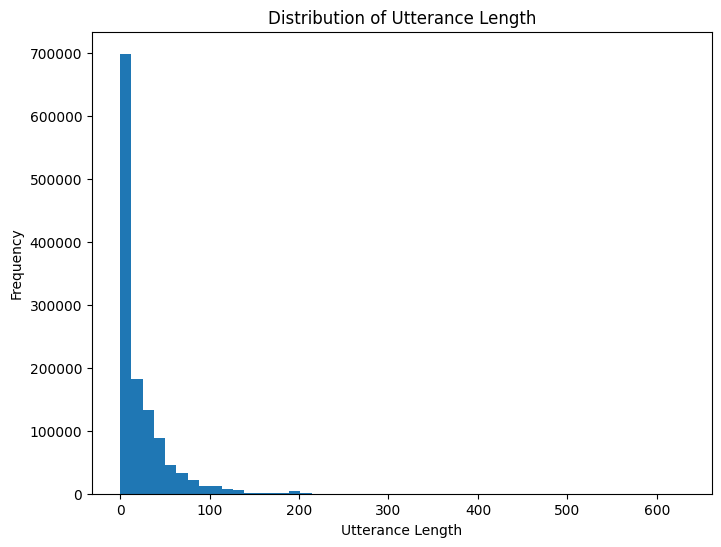

In [14]:
import matplotlib.pyplot as plt

# Compute the length of each utterance
df_vis['utterance_length'] = df_vis['Utterance'].apply(len)

# Create a histogram
plt.figure(figsize=(8, 6))
plt.hist(df_vis['utterance_length'], bins=50)
plt.xlabel('Utterance Length')
plt.ylabel('Frequency')
plt.title('Distribution of Utterance Length')
plt.show()


In [15]:
def compute_lexical_diversity(text):
    # Tokenize the text into individual words
    tokens = nltk.word_tokenize(text)

    # Calculate the number of unique words (vocabulary)
    vocabulary_size = len(set(tokens))

    # Calculate the lexical diversity as the ratio of unique words to total words
    lexical_diversity = vocabulary_size / len(tokens) if len(tokens) > 0 else 0

    return lexical_diversity


# Compute the lexical diversity for each utterance
df_vis['lexical_diversity'] = df_vis['Utterance'].apply(compute_lexical_diversity)


In [16]:
def compute_word_frequency(text):
    # Tokenize the text into individual words
    tokens = nltk.word_tokenize(text)

    # Compute the word frequency distribution
    word_freq = nltk.FreqDist(tokens)

    return word_freq


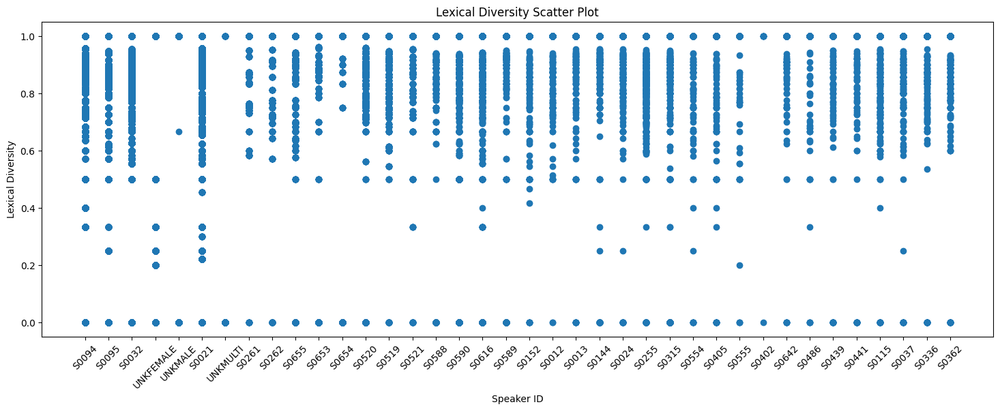

In [17]:
import matplotlib.pyplot as plt

# Create a scatter plot
plt.figure(figsize=(18, 6))
plt.scatter(df_vis['SpeakerID'], df_vis['lexical_diversity'])
plt.xlabel('Speaker ID')
plt.ylabel('Lexical Diversity')
plt.title('Lexical Diversity Scatter Plot')
plt.xticks(rotation=45)
plt.show()

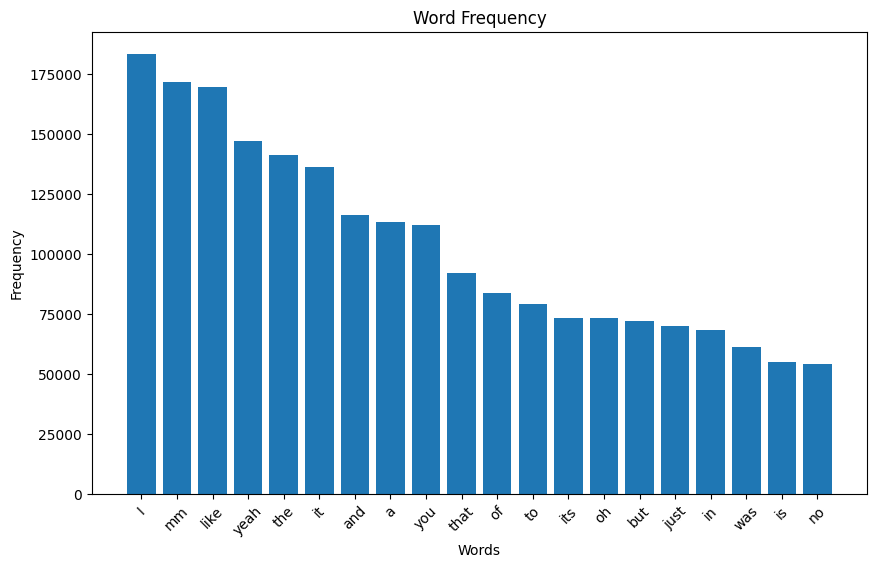

In [18]:
import matplotlib.pyplot as plt
from nltk import FreqDist

# Calculate word frequency
word_freq = compute_word_frequency(df_vis['Utterance'].str.cat(sep=' '))

# Get the most common words and their frequencies
most_common = word_freq.most_common(20)
words = [word[0] for word in most_common]
frequencies = [freq[1] for freq in most_common]

# Plot the word frequency
plt.figure(figsize=(10, 6))
plt.bar(words, frequencies)
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title('Word Frequency')
plt.xticks(rotation=45)
plt.show()


In [19]:
for index, row in df_vis.iterrows():
    utterance = row['Utterance']
    features = extract_linguistic_features(utterance)[1] 
    for feature, value in features.items():
        df_vis.loc[index, feature] = value

In [20]:
list(extract_linguistic_features(utterance)[1].keys())

['lexical_diversity',
 'sentence_length',
 'discourse_marker_count',
 'filler_count',
 'hesitation_count',
 'speech_rate']

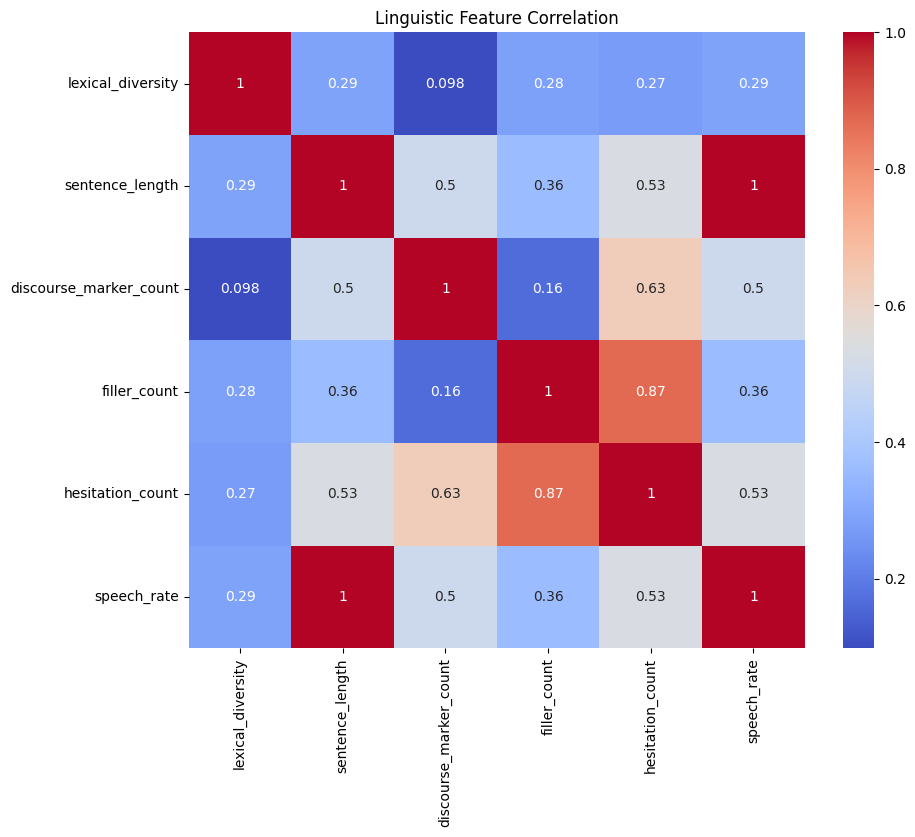

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select the columns containing the linguistic features
linguistic_feature_columns = list(extract_linguistic_features(utterance)[1].keys())

# Calculate the correlation matrix
correlation_matrix = df_vis[linguistic_feature_columns].corr()

# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', square=True)
plt.title('Linguistic Feature Correlation')
plt.show()


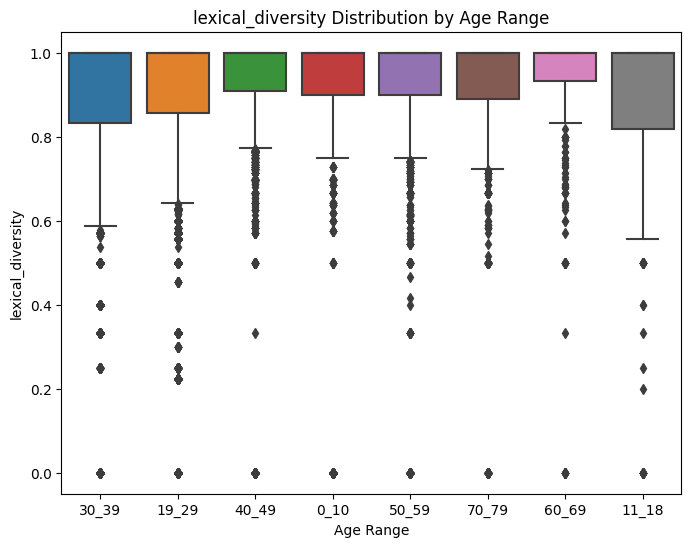

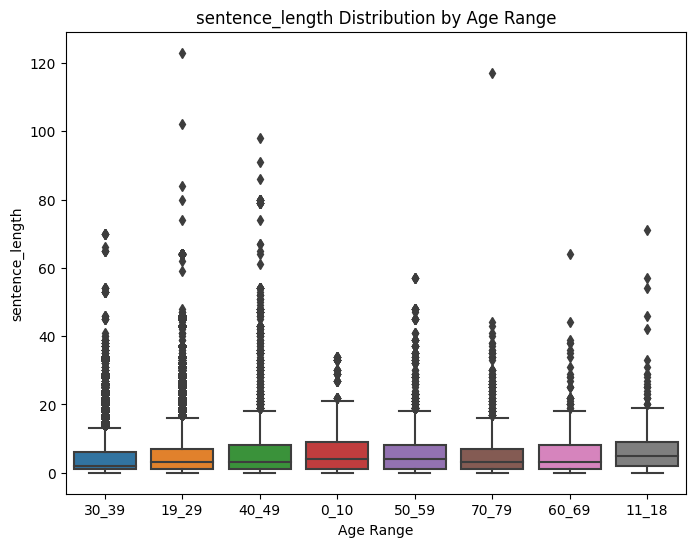

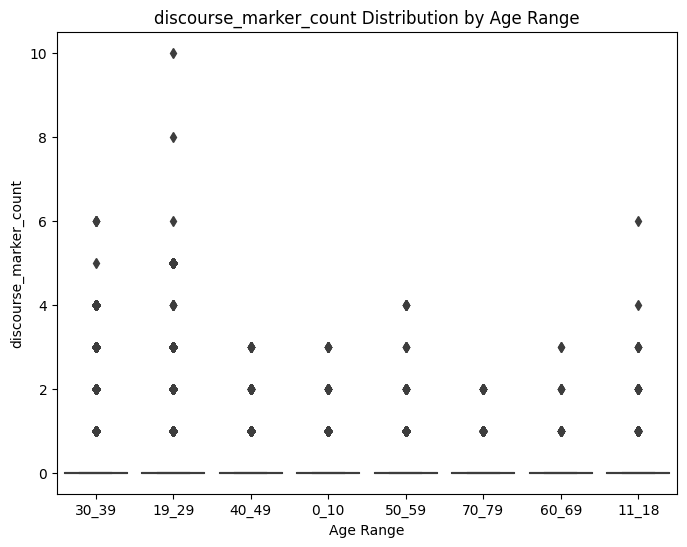

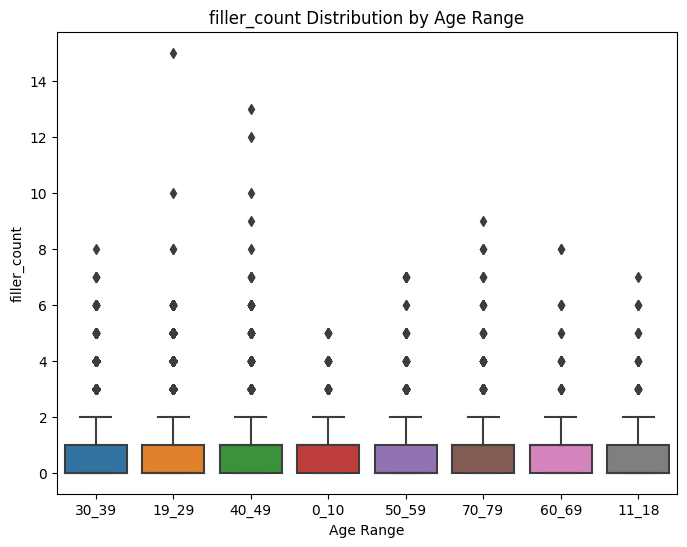

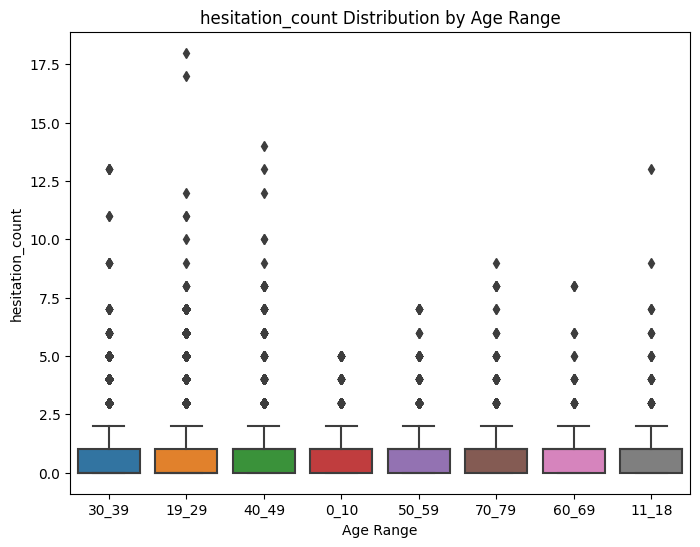

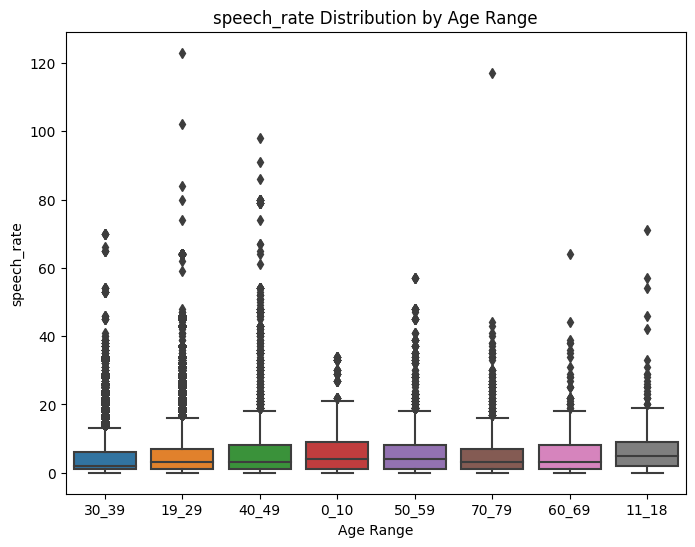

In [22]:
import seaborn as sns
import matplotlib.pyplot as plt


features = list(extract_linguistic_features(utterance)[1].keys())

for feature in features:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x='AgeLabel', y=feature, data=df_vis)
    plt.title(f'{feature} Distribution by Age Range')
    plt.xlabel('Age Range')
    plt.ylabel(feature)
    plt.show()


In [23]:
len(list(extract_linguistic_features(utterance)[1].keys()))

6

c:\Users\abhij\.conda\envs\dmassessment\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


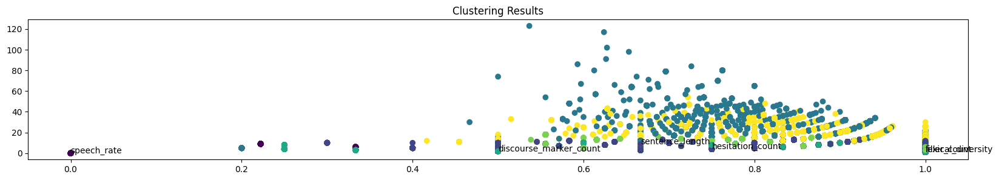

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Select the relevant features for clustering
selected_features = list(extract_linguistic_features(utterance)[1].keys())

# Extract the selected features from the dataset
X = df_vis[selected_features].values

# Scale or normalize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Choose the number of clusters
num_clusters = 6

# Apply K-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Add the cluster labels to the dataframe
df_vis['Cluster'] = clusters

plt.figure(figsize=(20, 3))

# Visualize the clusters
plt.scatter(X[:, 0], X[:, 1], c=clusters)
for i, txt in enumerate(selected_features):
    plt.annotate(txt, (X[i, 0], X[i, 1]), fontsize=10)
plt.title('Clustering Results')
plt.show()

- get the time variables from untagged and create a time-series analysis on dialogue data
- get a large pretrained model

In [25]:
# get a copy of the dataframe
df_copy = df.copy()

# Replace age label values
df_copy['AgeLabel'].replace({'19_29': 'young', '50_59': 'old', '60_69': 'old', '70_79': 'old', '80_89': 'old', '90_99': 'old'}, inplace=True)
# Drop rows with remaining age labels
df_copy = df_copy[df_copy['AgeLabel'].isin(['young', 'old'])]

# remove all the None values from Utterance column
df_copy = df_copy.dropna(subset=['Utterance'])

df_copy

,SpeakerID,AgeLabel,Utterance,Features
2,S0032,young,yeah yeah,lexical_diversity:0.5 sentence_length:2.0 disc...
4,S0032,young,I its something I,lexical_diversity:0.75 sentence_length:4.0 dis...
6,S0032,young,,lexical_diversity:0 sentence_length:0 discours...
10,S0032,young,,lexical_diversity:0 sentence_length:0 discours...
12,S0021,young,,lexical_diversity:0 sentence_length:0 discours...
...,...,...,...,...
1248104,S0032,young,no its not,lexical_diversity:1.0 sentence_length:3.0 disc...
1248105,S0021,young,I have like,lexical_diversity:1.0 sentence_length:3.0 disc...
1248107,S0032,young,,lexical_diversity:0 sentence_length:0 discours...
1248108,S0021,young,I have like tomato ketchup emergencies if I ru...,lexical_diversity:0.7391304347826086 sentence_...


In [26]:
df_copy['AgeLabel'].unique()

array(['young', 'old'], dtype=object)

In [27]:
import pandas as pd
from sklearn.utils import resample

# Define the input features (X) and target variable (y)
X = df_copy[['Utterance']]
y = df_copy['AgeLabel']

# Combine X and y into a single DataFrame
df = pd.concat([X, y], axis=1)

# Separate the majority and minority classes
young_class = df[df['AgeLabel'] == 'young']
old_class = df[df['AgeLabel'] == 'old']

# Undersample the majority class
young_undersampled = resample(young_class, replace=False, n_samples=len(old_class), random_state=42)

# Combine the undersampled majority class and the minority class
balanced_data = pd.concat([young_undersampled, old_class])

# Separate the features (X) and the target variable (y)
X_balanced = balanced_data[['Utterance']]
y_balanced = balanced_data['AgeLabel']

In [28]:
X_balanced.shape, y_balanced.shape

((15528, 1), (15528,))

In [29]:
y_balanced.value_counts()

AgeLabel
young    7764
old      7764
Name: count, dtype: int64

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced, test_size=0.2, random_state=42)

In [31]:
X_train.shape

(12422, 1)

In [32]:
X_test.shape

(3106, 1)

In [33]:
print(y_train.value_counts())

AgeLabel
old      6220
young    6202
Name: count, dtype: int64


In [34]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

# Initialize the vectorizer (choose either CountVectorizer or TfidfVectorizer)
vectorizer = CountVectorizer()  # or TfidfVectorizer()

# Fit the vectorizer on the training data
X_train_text = X_train['Utterance']  # assuming 'Utterance' column contains the text data
X_train_vectorized = vectorizer.fit_transform(X_train_text)

# Transform the testing data using the fitted vectorizer
X_test_text = X_test['Utterance']  # assuming 'Utterance' column contains the text data
X_test_vectorized = vectorizer.transform(X_test_text)

In [35]:
# Step 6: Model Training with no Linguistic Features
model = LogisticRegression()
model.fit(X_train_vectorized, y_train)

c:\Users\abhij\.conda\envs\dmassessment\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [36]:
# Step 7: Model Evaluation for old class
y_pred = model.predict(X_test_vectorized)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, pos_label="old")
recall = recall_score(y_test, y_pred, pos_label="old")
f1 = f1_score(y_test, y_pred, pos_label="old")

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Accuracy: 0.8161622665808114
Precision: 0.8462633451957295
Recall: 0.7700777202072538
F1 Score: 0.8063750423872499


In [37]:
# Step 7: Model Evaluation for young class
y_pred = model.predict(X_test_vectorized)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, pos_label="young")
recall = recall_score(y_test, y_pred, pos_label="young")
f1 = f1_score(y_test, y_pred, pos_label="young")

print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Accuracy: 0.8161622665808114
Precision: 0.7912992357436802
Recall: 0.8617157490396927
F1 Score: 0.8250076616610481


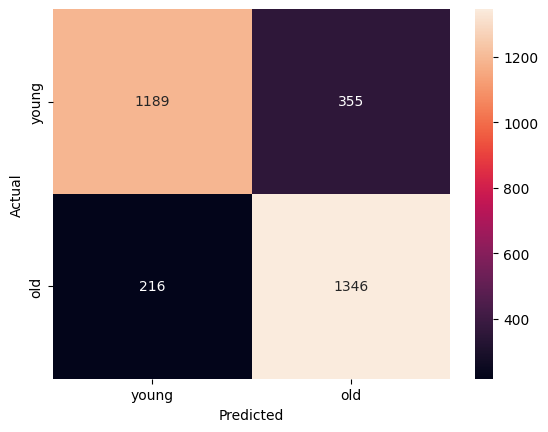

In [38]:
# plot confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

conf_mat = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=['young', 'old'], yticklabels=['young', 'old'])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

In [39]:
df_vis.shape

(1248110, 12)

In [40]:
df_vis['AgeLabel'].value_counts()

AgeLabel
19_29    599604
30_39    547325
40_49      4896
50_59      4478
70_79      2818
0_10       2180
11_18       470
60_69       468
Name: count, dtype: int64

In [41]:
# get a copy of the dataframe
df_with_features = df_vis.copy()

# convert the AgeLabel column, 19_29 to young and 50_59, 60_69, 70_79, 80_89, 90_99 to old
df_with_features['AgeLabel'].replace({'19_29': 'young', '50_59': 'old', '60_69': 'old', '70_79': 'old', '80_89': 'old', '90_99': 'old'}, inplace=True)

# drop rows with remaining age labels
df_with_features = df_with_features[df_with_features['AgeLabel'].isin(['young', 'old'])]

In [42]:
df_with_features['AgeLabel'].value_counts()

AgeLabel
young    599604
old        7764
Name: count, dtype: int64

In [43]:
df_with_features

,SpeakerID,AgeLabel,Utterance,Features,utterance_length,lexical_diversity,sentence_length,discourse_marker_count,filler_count,hesitation_count,speech_rate,Cluster
2,S0032,young,yeah yeah,lexical_diversity:0.5 sentence_length:2.0 disc...,9,0.500000,2.0,0.0,2.0,2.0,2.0,3
4,S0032,young,I its something I,lexical_diversity:0.75 sentence_length:4.0 dis...,17,0.750000,4.0,0.0,0.0,0.0,4.0,1
6,S0032,young,,lexical_diversity:0 sentence_length:0 discours...,0,0.000000,0.0,0.0,0.0,0.0,0.0,0
10,S0032,young,,lexical_diversity:0 sentence_length:0 discours...,0,0.000000,0.0,0.0,0.0,0.0,0.0,0
12,S0021,young,,lexical_diversity:0 sentence_length:0 discours...,0,0.000000,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1248104,S0032,young,no its not,lexical_diversity:1.0 sentence_length:3.0 disc...,10,1.000000,3.0,0.0,0.0,0.0,3.0,1
1248105,S0021,young,I have like,lexical_diversity:1.0 sentence_length:3.0 disc...,11,1.000000,3.0,1.0,0.0,1.0,3.0,4
1248107,S0032,young,,lexical_diversity:0 sentence_length:0 discours...,0,0.000000,0.0,0.0,0.0,0.0,0.0,0
1248108,S0021,young,I have like tomato ketchup emergencies if I ru...,lexical_diversity:0.7391304347826086 sentence_...,119,0.739130,23.0,2.0,2.0,4.0,23.0,2


In [44]:
df_with_features.columns

Index(['SpeakerID', 'AgeLabel', 'Utterance', 'Features', 'utterance_length',
       'lexical_diversity', 'sentence_length', 'discourse_marker_count',
       'filler_count', 'hesitation_count', 'speech_rate', 'Cluster'],
      dtype='object')

In [45]:
df_with_features.describe()

,utterance_length,lexical_diversity,sentence_length,discourse_marker_count,filler_count,hesitation_count,speech_rate,Cluster
count,607368.000000,607368.000000,607368.000000,607368.000000,607368.000000,607368.000000,607368.000000,607368.000000
mean,24.330457,0.810971,5.234224,0.169834,0.519395,0.689230,5.234224,2.015722
std,31.979818,0.357185,6.622813,0.498674,0.737525,0.975447,6.622813,1.481856
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,0.857143,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000
50%,13.000000,1.000000,3.000000,0.000000,0.000000,0.000000,3.000000,1.000000
75%,35.000000,1.000000,7.000000,0.000000,1.000000,1.000000,7.000000,3.000000
max,630.000000,1.000000,123.000000,10.000000,15.000000,18.000000,123.000000,5.000000


In [46]:
# get X and y
X = df_with_features[['Utterance', 'utterance_length', 'lexical_diversity', 'sentence_length', 'discourse_marker_count', 'filler_count', 'hesitation_count', 'speech_rate']]
y = df_with_features['AgeLabel']

# balance the dataset
young_class = df_with_features[df_with_features['AgeLabel'] == 'young']
old_class = df_with_features[df_with_features['AgeLabel'] == 'old']

young_undersampled = resample(young_class, replace=False, n_samples=len(old_class), random_state=42)

balanced_data = pd.concat([young_undersampled, old_class])

# separate the features (X) and the target variable (y)
X_balanced = balanced_data[['Utterance', 'utterance_length', 'lexical_diversity', 'sentence_length', 'discourse_marker_count', 'filler_count', 'hesitation_count', 'speech_rate']]
y_balanced = balanced_data['AgeLabel']

X_balanced.shape, y_balanced.shape

((15528, 8), (15528,))

In [47]:
# split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced, test_size=0.2, random_state=42)

In [48]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((12422, 8), (3106, 8), (12422,), (3106,))

In [49]:
y_train.value_counts()

AgeLabel
old      6220
young    6202
Name: count, dtype: int64

In [50]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

# Initialize the vectorizer (choose either CountVectorizer or TfidfVectorizer)
vectorizer = CountVectorizer()  # or TfidfVectorizer()

# Fit the vectorizer on the training data
X_train_text = X_train['Utterance']  # assuming 'Utterance' column contains the text data
X_train_vectorized = vectorizer.fit_transform(X_train_text)

# Transform the testing data using the fitted vectorizer
X_test_text = X_test['Utterance']  # assuming 'Utterance' column contains the text data
X_test_vectorized = vectorizer.transform(X_test_text)

In [51]:
# Step 6: Model Training with Linguistic Features
model2 = LogisticRegression(max_iter=1000)
model2.fit(X_train_vectorized, y_train)

LogisticRegression(max_iter=1000)

In [52]:
# Step 7: Model Evaluation
from sklearn.metrics import classification_report


y_pred = model2.predict(X_test_vectorized)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         old       0.85      0.77      0.81      1544
       young       0.79      0.86      0.83      1562

    accuracy                           0.82      3106
   macro avg       0.82      0.82      0.82      3106
weighted avg       0.82      0.82      0.82      3106



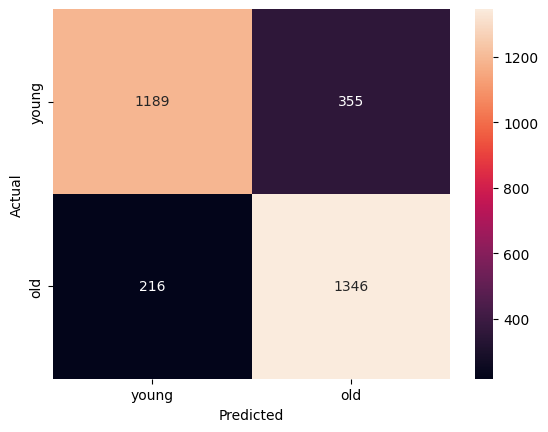

In [53]:
# plot confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

conf_mat = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=['young', 'old'], yticklabels=['young', 'old'])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()

By comparing both models, one with just utterances and the utterances and features, we expect to see a difference in the performance of the models. But in this case, the performance of the model is almost the same. I assume this is because the data is not large enough to make a difference in the performance of the model. If we had a large dataset, then we would have seen a difference in the performance of the model.

In [54]:
# predictions for the first 5 test samples

X_test_transformed = vectorizer.inverse_transform(X_test_vectorized)

predictions = model.predict(X_test_vectorized)

# for i in range(len(X_test_transformed)):
for i in range(5):
    sentence = " ".join(X_test_transformed[i])
    predicted_output = predictions[i]
    real_output = y_test.iloc[i]
    
    print("Input Sentence: ", sentence)
    print("Predicted Output: ", predicted_output)
    print("Real Output: ", real_output)
    print()

Input Sentence:  he
Predicted Output:  old
Real Output:  young

Input Sentence:  and need no pool swimming the thing whole you
Predicted Output:  old
Real Output:  old

Input Sentence:  
Predicted Output:  young
Real Output:  young

Input Sentence:  mm
Predicted Output:  young
Real Output:  young

Input Sentence:  mm
Predicted Output:  young
Real Output:  old



In [55]:
# get the predictions for the whole test set and display the results in a dataframe
X_test_transformed = vectorizer.inverse_transform(X_test_vectorized)
predictions = model.predict(X_test_vectorized)

results_df = pd.DataFrame({'Input Sentence': [' '.join(sentence) for sentence in X_test_transformed],
                          'Predicted Output': predictions,
                          'Real Output': y_test.values})

results_df

,Input Sentence,Predicted Output,Real Output
0,he,old,young
1,and need no pool swimming the thing whole you,old,old
2,,young,young
3,mm,young,young
4,mm,young,old
...,...,...,...
3101,yeah,old,old
3102,is it so time whatever,young,young
3103,did make these you,young,old
3104,ill speak to,old,old


In [56]:
wrong_predictions = results_df[results_df['Predicted Output'] != results_df['Real Output']]
wrong_predictions

,Input Sentence,Predicted Output,Real Output
0,he,old,young
4,mm,young,old
11,yeah,old,young
18,an day eight hour thats,young,old
19,er,old,young
...,...,...,...
3083,didnt help it last,young,old
3088,so,young,old
3096,is it yeah,old,young
3098,where,young,old


In [57]:
# # Get feature names
# import numpy as np

# # Retrieve the coefficients from the trained model
# coefficients = model2.coef_[0]

# # Get feature names from the vectorizer
# feature_names = vectorizer.get_feature_names()

# print(len(feature_names))

# # Get feature names
# feature_names = ['Utterance', 'utterance_length', 'lexical_diversity', 'sentence_length',
#                  'discourse_marker_count', 'filler_count', 'hesitation_count',
#                  'speech_rate']

# # Plot the feature importances
# plt.figure(figsize=(10, 6))
# plt.barh(range(len(feature_names)), np.abs(coefficients), align='center')
# plt.yticks(range(len(feature_names)), feature_names)
# plt.xlabel('Coefficient Magnitude')
# plt.ylabel('Features')
# plt.title('Feature Importance for Logistic Regression')
# plt.tight_layout()
# plt.show()

In [58]:
# predictions for the first 5 test samples

X_test_transformed = vectorizer.inverse_transform(X_test_vectorized)

predictions = model.predict(X_test_vectorized)

# for i in range(len(X_test_transformed)):
for i in range(5):
    sentence = " ".join(X_test_transformed[i])
    predicted_output = predictions[i]
    real_output = y_test.iloc[i]
    
    print("Input Sentence: ", sentence)
    print("Predicted Output: ", predicted_output)
    print("Real Output: ", real_output)
    print()

Input Sentence:  he
Predicted Output:  old
Real Output:  young

Input Sentence:  and need no pool swimming the thing whole you
Predicted Output:  old
Real Output:  old

Input Sentence:  
Predicted Output:  young
Real Output:  young

Input Sentence:  mm
Predicted Output:  young
Real Output:  young

Input Sentence:  mm
Predicted Output:  young
Real Output:  old



In [59]:
# get the predictions for the whole test set and display the results in a dataframe
X_test_transformed = vectorizer.inverse_transform(X_test_vectorized)
predictions = model.predict(X_test_vectorized)

results_df = pd.DataFrame({'Input Sentence': [' '.join(sentence) for sentence in X_test_transformed],
                          'Predicted Output': predictions,
                          'Real Output': y_test.values})

results_df

,Input Sentence,Predicted Output,Real Output
0,he,old,young
1,and need no pool swimming the thing whole you,old,old
2,,young,young
3,mm,young,young
4,mm,young,old
...,...,...,...
3101,yeah,old,old
3102,is it so time whatever,young,young
3103,did make these you,young,old
3104,ill speak to,old,old


In [60]:
wrong_predictions = results_df[results_df['Predicted Output'] != results_df['Real Output']]
wrong_predictions

,Input Sentence,Predicted Output,Real Output
0,he,old,young
4,mm,young,old
11,yeah,old,young
18,an day eight hour thats,young,old
19,er,old,young
...,...,...,...
3083,didnt help it last,young,old
3088,so,young,old
3096,is it yeah,old,young
3098,where,young,old


# Using Bert Model

In [61]:
df.columns

Index(['Utterance', 'AgeLabel'], dtype='object')

In [62]:
import pandas as pd
from sklearn.model_selection import train_test_split
from transformers import BertTokenizer, BertForSequenceClassification, AdamW
import torch

# Split the data into training and testing sets
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

# Get the training and testing utterances and labels
train_texts = train_df['Utterance'].tolist()
train_labels = train_df['AgeLabel'].tolist()
test_texts = test_df['Utterance'].tolist()
test_labels = test_df['AgeLabel'].tolist()

c:\Users\abhij\.conda\envs\dmassessment\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [63]:
import numpy as np

train_labels = np.array(train_labels)
test_labels = np.array(test_labels)


In [64]:
# Load the BERT tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Load the BERT model for sequence classification
model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=2)


Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

In [65]:
train_labels

array(['young', 'young', 'young', ..., 'young', 'young', 'young'],
      dtype='<U5')

In [66]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
train_labels = label_encoder.fit_transform(train_labels)
test_labels = label_encoder.transform(test_labels)

In [67]:
# Tokenize and encode the training utterances
train_encodings = tokenizer(train_texts, truncation=True, padding=True)

# Tokenize and encode the testing utterances
test_encodings = tokenizer(test_texts, truncation=True, padding=True)

# Create torch tensors for the encoded data and labels
train_dataset = torch.utils.data.TensorDataset(
    torch.tensor(train_encodings['input_ids']),
    torch.tensor(train_encodings['attention_mask']),
    torch.tensor(train_labels)
)
test_dataset = torch.utils.data.TensorDataset(
    torch.tensor(test_encodings['input_ids']),
    torch.tensor(test_encodings['attention_mask']),
    torch.tensor(test_labels)
)


In [68]:
# Define the training parameters
batch_size = 16
epochs = 3

# Create a DataLoader for the training and testing datasets
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size)

In [69]:
# import torch
# import torch.cuda

# # Set the max_split_size_mb parameter
# torch.cuda.set_per_process_memory_fraction(fraction=0.2)

# torch.cuda.empty_cache()

In [70]:
# import gc

# gc.collect()

# torch.cuda.empty_cache()

In [71]:
# # Set the maximum memory split size in megabytes
# torch.backends.cuda.max_split_size_mb = 2000  # Adjust the value as needed

In [72]:
# import torch
# from GPUtil import showUtilization as gpu_usage
# from numba import cuda

# def free_gpu_cache():
#     print("Initial GPU Usage")
#     gpu_usage()                             

#     torch.cuda.empty_cache()

#     cuda.select_device(0)
#     cuda.close()
#     cuda.select_device(0)

#     print("GPU Usage after emptying the cache")
#     gpu_usage()

# free_gpu_cache()  

In [73]:
# gpu_usage()

In [74]:
# torch.cuda.device_count()
# cuda.select_device(0)

In [75]:
# import os
# os.environ['CUDA_LAUNCH_BLOCKING'] = '1'


In [76]:
# torch.cuda.memory_allocated()

In [77]:
# # Set the device (CPU or GPU)
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# # Move the model to the device
# model.to(device)

# # Set the optimizer and learning rate
# optimizer = AdamW(model.parameters(), lr=1e-5)

# # Training loop
# model.train()
# for epoch in range(epochs):
#     for batch in train_loader:
#         input_ids, attention_mask, labels = batch
#         print("Input ids:", input_ids.shape, "Attention mask:", attention_mask.shape, "Labels:", labels.shape)
#         input_ids = input_ids.to(device)
#         attention_mask = attention_mask.to(device)
#         labels = labels.to(device)
#         labels = labels.to(torch.long)

#         optimizer.zero_grad()

#         outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
#         loss = outputs.loss
#         loss.backward()
#         optimizer.step()


c:\Users\abhij\.conda\envs\dmassessment\Lib\site-packages\transformers\optimization.py:407: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Input ids: torch.Size([16, 139]) Attention mask: torch.Size([16, 139]) Labels: torch.Size([16])
Input ids: torch.Size([16, 139]) Attention mask: torch.Size([16, 139]) Labels: torch.Size([16])
Input ids: torch.Size([16, 139]) Attention mask: torch.Size([16, 139]) Labels: torch.Size([16])
Input ids: torch.Size([16, 139]) Attention mask: torch.Size([16, 139]) Labels: torch.Size([16])
Input ids: torch.Size([16, 139]) Attention mask: torch.Size([16, 139]) Labels: torch.Size([16])
Input ids: torch.Size([16, 139]) Attention mask: torch.Size([16, 139]) Labels: torch.Size([16])
Input ids: torch.Size([16, 139]) Attention mask: torch.Size([16, 139]) Labels: torch.Size([16])
Input ids: torch.Size([16, 139]) Attention mask: torch.Size([16, 139]) Labels: torch.Size([16])
Input ids: torch.Size([16, 139]) Attention mask: torch.Size([16, 139]) Labels: torch.Size([16])
Input ids: torch.Size([16, 139]) Attention mask: torch.Size([16, 139]) Labels: torch.Size([16])
Input ids: torch.Size([16, 139]) Attenti

In [83]:
# save the model
model.save_pretrained('models/bert_model')

In [84]:
# get model from saved
model = BertForSequenceClassification.from_pretrained('models/bert_model', num_labels=2)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model.to(device)

# evaluate the model
model.eval()
with torch.no_grad():
    correct = 0
    total = 0
    for batch in test_loader:
        input_ids, attention_mask, labels = batch
        input_ids = input_ids.to(device)
        attention_mask = attention_mask.to(device)
        labels = labels.to(device)

        outputs = model(input_ids, attention_mask=attention_mask)
        _, predicted = torch.max(outputs.logits, dim=1)

        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    accuracy = correct / total
    print('Accuracy on test data: {:.2f}%'.format(accuracy * 100))

Accuracy on test data: 99.47%
